<h1><center>😀😃 Store Sales Prediction 😀😃</center></h1>

In [1]:
#Step 1 is to load in the packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import scipy as sp
import warnings
import datetime
warnings.filterwarnings("ignore")
%matplotlib inline
import emoji

import statsmodels.api as sm
import statsmodels.stats.api as sms
from scipy.stats import boxcox
from pylab import *

import cufflinks as cf
import chart_studio.plotly as py
import plotly.graph_objects as go
import plotly.express as px
import plotly.graph_objs as js

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

<h1><center>Load/View Dataset 🧐</center></h1>

In [2]:
#Step 2 Bring in the Data/Quick exploration
data = pd.read_excel("../Data/store-sales.xlsx")

In [3]:
data.head(15)

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,San Francisco,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08:00,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,NYC,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29:00,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,San Francisco,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,13:23:00,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,San Francisco,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33:00,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,San Francisco,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,10:37:00,Ewallet,604.17,4.761905,30.2085,5.3
5,699-14-3026,C,NYC,Normal,Male,Electronic accessories,85.39,7,29.8865,627.6165,2019-03-25,18:30:00,Ewallet,597.73,4.761905,29.8865,4.1
6,355-53-5943,A,San Francisco,Member,Female,Electronic accessories,68.84,6,20.6520,433.6920,2019-02-25,14:36:00,Ewallet,413.04,4.761905,20.6520,5.8
7,315-22-5665,C,NYC,Normal,Female,Home and lifestyle,73.56,10,36.7800,772.3800,2019-02-24,11:38:00,Ewallet,735.60,4.761905,36.7800,8.0
8,665-32-9167,A,San Francisco,Member,Female,Health and beauty,36.26,2,3.6260,76.1460,2019-01-10,17:15:00,Credit card,72.52,4.761905,3.6260,7.2
9,692-92-5582,B,Seattle,Member,Female,Food and beverages,54.84,3,8.2260,172.7460,2019-02-20,13:27:00,Credit card,164.52,4.761905,8.2260,5.9


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Invoice ID               1000 non-null   object        
 1   Branch                   1000 non-null   object        
 2   City                     1000 non-null   object        
 3   Customer type            1000 non-null   object        
 4   Gender                   1000 non-null   object        
 5   Product line             1000 non-null   object        
 6   Unit price               1000 non-null   float64       
 7   Quantity                 1000 non-null   int64         
 8   Tax 5%                   1000 non-null   float64       
 9   Total                    1000 non-null   float64       
 10  Date                     1000 non-null   datetime64[ns]
 11  Time                     1000 non-null   object        
 12  Payment                  1000 non-n

In [5]:
data.describe()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905,15.379369,6.97270
std,26.494628,2.923431,11.708825,245.885335,234.17651,0.000000,11.708825,1.71858
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905,0.508500,4.00000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905,5.924875,5.50000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905,12.088000,7.00000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905,22.445250,8.50000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905,49.650000,10.00000


In [6]:
data.shape

(1000, 17)

In [7]:
data.columns

Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Date',
       'Time', 'Payment', 'cogs', 'gross margin percentage', 'gross income',
       'Rating'],
      dtype='object')

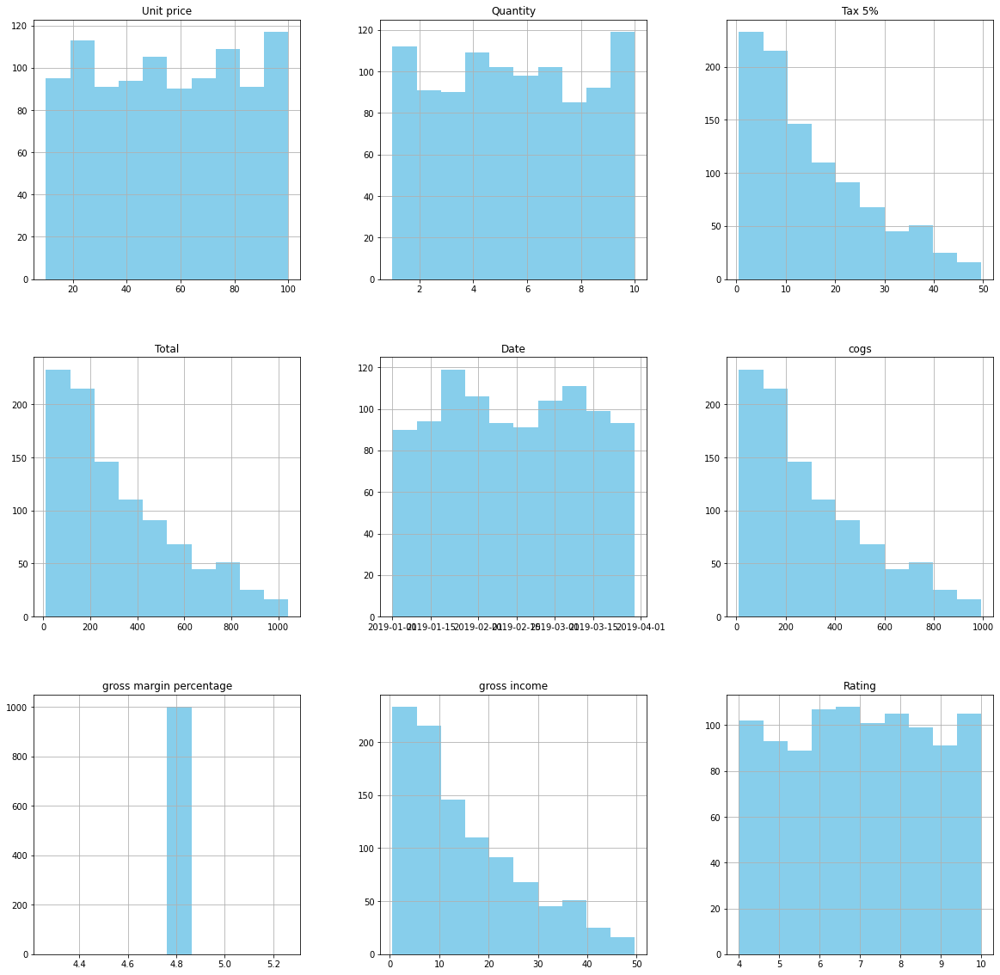

In [8]:
data.hist(figsize=(20,20),color = "skyblue")
plt.show()

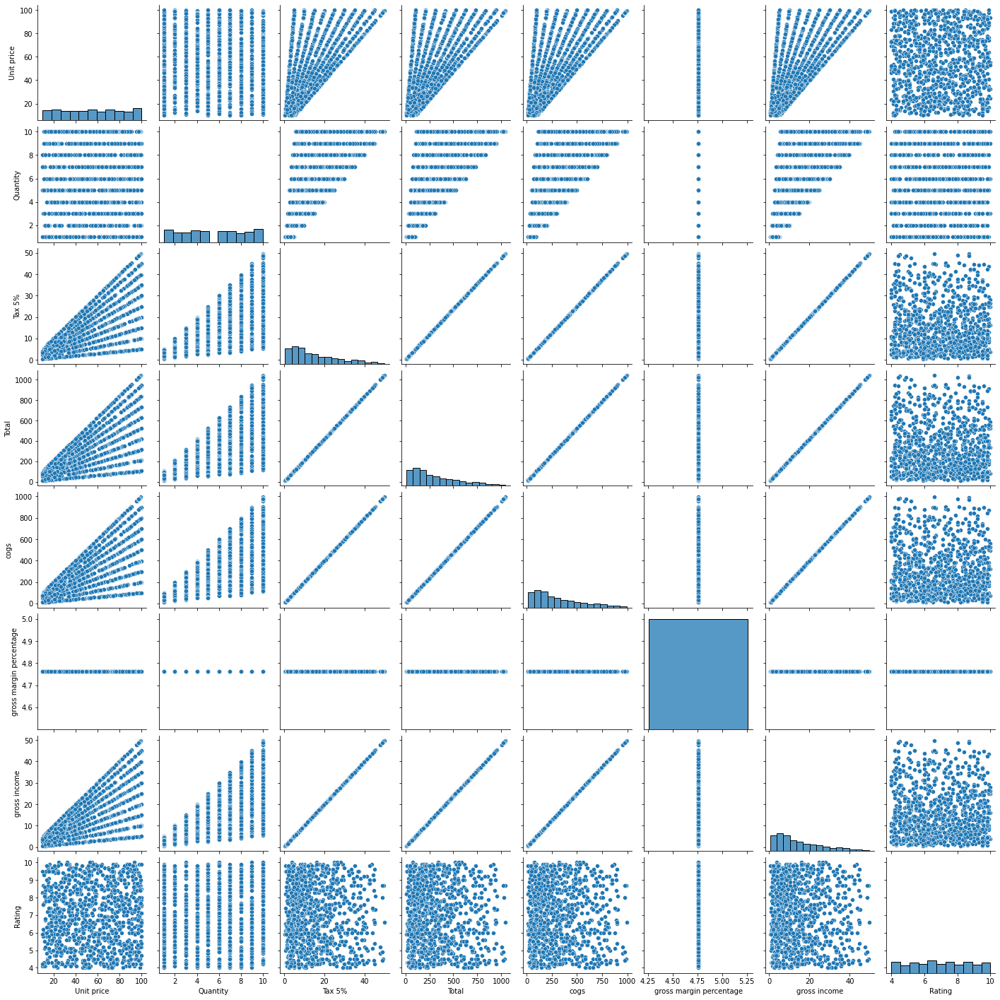

In [9]:
sns.pairplot(data=data)

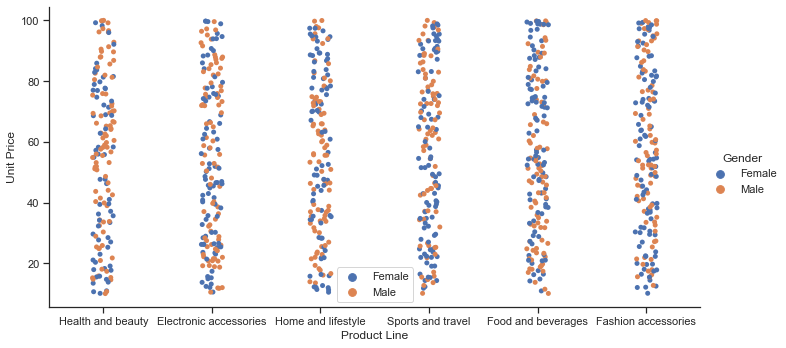

In [10]:
sns.set_theme(style="ticks")
sns.catplot(x='Product line', y='Unit price', hue='Gender', data=data, aspect=2)
plt.xlabel('Product Line')
plt.ylabel('Unit Price')
plt.legend();

<AxesSubplot:xlabel='Unit price', ylabel='gross income'>

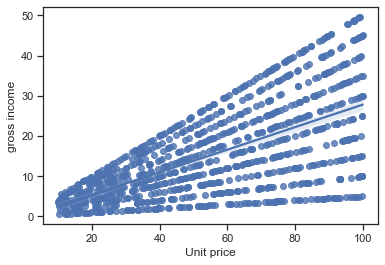

In [11]:
sns.regplot(x='Unit price', y= 'gross income', data=data)

In [12]:
#Interactive Barchart
barchart=data.head()

trace1 = js.Bar(
        x=barchart["Rating"],
        y=barchart["Unit price"],
        name="Rating Vs Unit Price")

trace2 = js.Bar(
        x=barchart["Rating"],
        y=barchart["Quantity"],
        name="Rating Vs Quantity")

bar=[trace1, trace2]
layout =go.Layout(barmode="group")
fig= go.Figure(data=bar)
iplot(fig, filename="grouped-bar")

In [13]:
#3D Plotly Model
x = data["Unit price"]
y = data["Quantity"]
z = data["Rating"]

trace1 = go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode="markers",
    marker=dict(
    size=12,
    color=z,
    colorscale="Viridis",
    opacity=0.8))

ThreeDscat= [trace1]
layout=go.Layout(
    margin=dict(
    l=0,
    r=0,
    b=0,
    t=0)
)

fig=go.Figure(data=ThreeDscat, layout=layout)
iplot(fig, filename="3d-plot")

In [14]:
#Creating a file to save scatter plot
if not os.path.exists("images"):
    os.mkdir("images")

In [15]:
#Saving 3D Scatterplot
#fig.write_image("images/fig1.jpeg")

In [16]:
#Viewing Correlation Between Unit Price and Gross Income
data['Unit price'].corr(data['gross income'])*100

63.3962088589069

In [17]:
#Step 3 is to collect and wrangle the data
#for this I will use LabelEncoder from sklearn
data1 = pd.read_excel("../Data/store-sales.xlsx")
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [18]:
#Finding the categorical features and changing to numeric
list1=list(data1.columns)

list_categorical=[]
for i in list1:
    if data1[i].dtype=='object':
        list_categorical.append(i)
        
for i in list_categorical:
    data1[i]=le.fit_transform(data[i])

In [19]:
#Numeric Data
data1.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,814,0,1,0,0,3,74.69,7,26.1415,548.9715,2019-01-05,146,2,522.83,4.761905,26.1415,9.1
1,142,2,0,1,0,0,15.28,5,3.8200,80.2200,2019-03-08,23,0,76.40,4.761905,3.8200,9.6
2,653,0,1,1,1,4,46.33,7,16.2155,340.5255,2019-03-03,155,1,324.31,4.761905,16.2155,7.4
3,18,0,1,0,1,3,58.22,8,23.2880,489.0480,2019-01-27,485,2,465.76,4.761905,23.2880,8.4
4,339,0,1,1,1,5,86.31,7,30.2085,634.3785,2019-02-08,29,2,604.17,4.761905,30.2085,5.3


In [20]:
to_describe=data1.describe()
#to_describe.to_csv("to_describe.csv")
to_describe

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross margin percentage,gross income,Rating
count,1000.000000,1000.000000,1000.0000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000
mean,499.500000,0.988000,1.0040,0.499000,0.499000,2.452000,55.672130,5.510000,15.379369,322.966749,251.176000,1.001000,307.58738,4.761905,15.379369,6.97270
std,288.819436,0.817633,0.8128,0.500249,0.500249,1.715412,26.494628,2.923431,11.708825,245.885335,147.066923,0.830475,234.17651,0.000000,11.708825,1.71858
min,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,10.080000,1.000000,0.508500,10.678500,0.000000,0.000000,10.17000,4.761905,0.508500,4.00000
25%,249.750000,0.000000,0.0000,0.000000,0.000000,1.000000,32.875000,3.000000,5.924875,124.422375,127.000000,0.000000,118.49750,4.761905,5.924875,5.50000
50%,499.500000,1.000000,1.0000,0.000000,0.000000,2.000000,55.230000,5.000000,12.088000,253.848000,248.000000,1.000000,241.76000,4.761905,12.088000,7.00000
75%,749.250000,2.000000,2.0000,1.000000,1.000000,4.000000,77.935000,8.000000,22.445250,471.350250,383.000000,2.000000,448.90500,4.761905,22.445250,8.50000
max,999.000000,2.000000,2.0000,1.000000,1.000000,5.000000,99.960000,10.000000,49.650000,1042.650000,505.000000,2.000000,993.00000,4.761905,49.650000,10.00000


In [21]:
#Original Data
data.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,San Francisco,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08:00,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,NYC,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29:00,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,San Francisco,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,13:23:00,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,San Francisco,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33:00,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,San Francisco,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,10:37:00,Ewallet,604.17,4.761905,30.2085,5.3


In [22]:
#Pearson Correlation
data1.drop("gross margin percentage", axis=1, inplace=True)
data1.corr(method='pearson')

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross income,Rating
Invoice ID,1.000000,-0.041753,0.010473,0.070519,0.023552,0.027589,-0.009213,0.024977,0.027277,0.027277,0.009224,0.021478,0.027277,0.027277,-0.003787
Branch,-0.041753,1.000000,-0.493972,-0.019608,-0.056318,-0.053938,0.028202,0.015964,0.041047,0.041047,0.035921,-0.050104,0.041047,0.041047,0.010238
City,0.010473,-0.493972,1.000000,0.014781,0.044323,0.045367,-0.014483,-0.013919,-0.028363,-0.028363,0.030576,0.031136,-0.028363,-0.028363,-0.060332
Customer type,0.070519,-0.019608,0.014781,1.000000,0.039996,-0.036800,-0.020238,-0.016763,-0.019670,-0.019670,-0.020162,0.018073,-0.019670,-0.019670,0.018889
Gender,0.023552,-0.056318,0.044323,0.039996,1.000000,0.005193,0.015445,-0.074258,-0.049451,-0.049451,0.085054,0.044578,-0.049451,-0.049451,0.004800
Product line,0.027589,-0.053938,0.045367,-0.036800,0.005193,1.000000,0.019321,0.020256,0.031621,0.031621,-0.058607,0.029896,0.031621,0.031621,-0.020529
Unit price,-0.009213,0.028202,-0.014483,-0.020238,0.015445,0.019321,1.000000,0.010778,0.633962,0.633962,0.008155,-0.015941,0.633962,0.633962,-0.008778
Quantity,0.024977,0.015964,-0.013919,-0.016763,-0.074258,0.020256,0.010778,1.000000,0.705510,0.705510,-0.009045,-0.003921,0.705510,0.705510,-0.015815
Tax 5%,0.027277,0.041047,-0.028363,-0.019670,-0.049451,0.031621,0.633962,0.705510,1.000000,1.000000,-0.005298,-0.012434,1.000000,1.000000,-0.036442
Total,0.027277,0.041047,-0.028363,-0.019670,-0.049451,0.031621,0.633962,0.705510,1.000000,1.000000,-0.005298,-0.012434,1.000000,1.000000,-0.036442


In [23]:
#Pearson Correlation Heatmap
data1.corr(method='pearson').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross income,Rating
Invoice ID,1.0,-0.042,0.01,0.071,0.024,0.028,-0.0092,0.025,0.027,0.027,0.0092,0.021,0.027,0.027,-0.0038
Branch,-0.042,1.0,-0.49,-0.02,-0.056,-0.054,0.028,0.016,0.041,0.041,0.036,-0.05,0.041,0.041,0.01
City,0.01,-0.49,1.0,0.015,0.044,0.045,-0.014,-0.014,-0.028,-0.028,0.031,0.031,-0.028,-0.028,-0.06
Customer type,0.071,-0.02,0.015,1.0,0.04,-0.037,-0.02,-0.017,-0.02,-0.02,-0.02,0.018,-0.02,-0.02,0.019
Gender,0.024,-0.056,0.044,0.04,1.0,0.0052,0.015,-0.074,-0.049,-0.049,0.085,0.045,-0.049,-0.049,0.0048
Product line,0.028,-0.054,0.045,-0.037,0.0052,1.0,0.019,0.02,0.032,0.032,-0.059,0.03,0.032,0.032,-0.021
Unit price,-0.0092,0.028,-0.014,-0.02,0.015,0.019,1.0,0.011,0.63,0.63,0.0082,-0.016,0.63,0.63,-0.0088
Quantity,0.025,0.016,-0.014,-0.017,-0.074,0.02,0.011,1.0,0.71,0.71,-0.009,-0.0039,0.71,0.71,-0.016
Tax 5%,0.027,0.041,-0.028,-0.02,-0.049,0.032,0.63,0.71,1.0,1.0,-0.0053,-0.012,1.0,1.0,-0.036
Total,0.027,0.041,-0.028,-0.02,-0.049,0.032,0.63,0.71,1.0,1.0,-0.0053,-0.012,1.0,1.0,-0.036


In [24]:
from pandas_profiling import ProfileReport
profile = ProfileReport(data1, title="Store Sales Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Starting the Machine Learning Process On All Data

In [24]:
#First I will need to drop Date coloumn because it is not formatted for my model and is unnecessary for my prediction
data1.drop("Date", axis=1, inplace=True)

In [25]:
#removing my Y variable from the dataset
y=data1['Gender']
x=data1.drop('Gender',axis=1)

In [26]:
y.head()

0    0
1    0
2    1
3    1
4    1
Name: Gender, dtype: int32

In [27]:
x.head()

,Invoice ID,Branch,City,Customer type,Product line,Unit price,Quantity,Tax 5%,Total,Time,Payment,cogs,gross income,Rating
0,814,0,1,0,3,74.69,7,26.1415,548.9715,146,2,522.83,26.1415,9.1
1,142,2,0,1,0,15.28,5,3.8200,80.2200,23,0,76.40,3.8200,9.6
2,653,0,1,1,4,46.33,7,16.2155,340.5255,155,1,324.31,16.2155,7.4
3,18,0,1,0,3,58.22,8,23.2880,489.0480,485,2,465.76,23.2880,8.4
4,339,0,1,1,5,86.31,7,30.2085,634.3785,29,2,604.17,30.2085,5.3


In [28]:
#going with the pareto principle 
#80/20 train test split
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

In [29]:
#View split
print(len(x_train))
print(len(x_test))
print(len(y_train))
print(len(y_test))

800
200
800
200


In [30]:
#DecisionTree with all features
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(criterion='gini')

dtree.fit(x_train,y_train)

DecisionTreeClassifier()

In [31]:
#Classification Report:
y_pred=dtree.predict(x_test)
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print("Decision Tree Classification Report:\n",classification_report(y_test,y_pred))
print("Confusion Matrix:\n",confusion_matrix(y_test,y_pred))
print("Training Score:\n",dtree.score(x_train,y_train)*100)

Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.45      0.49       100
           1       0.52      0.60      0.56       100

    accuracy                           0.53       200
   macro avg       0.53      0.53      0.52       200
weighted avg       0.53      0.53      0.52       200

Confusion Matrix:
 [[45 55]
 [40 60]]
Training Score:
 100.0


In [32]:
#Feature Importance Array DecisionTree
dtree.feature_importances_

array([0.1473382 , 0.        , 0.0450383 , 0.02465094, 0.05540439,
       0.17798978, 0.03539673, 0.03206349, 0.0503339 , 0.15635542,
       0.03218847, 0.04131648, 0.08252849, 0.11939542])

In [33]:
#Feature Importance On DecisionTree
dtreefeatures=pd.DataFrame({"Feature_names":x.columns, "Importances":dtree.feature_importances_})
dtreefeatures_descending=dtreefeatures.sort_values(by="Importances", ascending=False)
dtreefeatures_descending

,Feature_names,Importances
5,Unit price,0.177990
9,Time,0.156355
0,Invoice ID,0.147338
13,Rating,0.119395
12,gross income,0.082528
4,Product line,0.055404
8,Total,0.050334
2,City,0.045038
11,cogs,0.041316
6,Quantity,0.035397


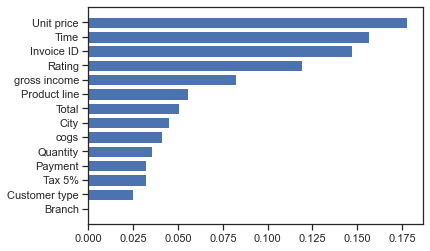

In [34]:
#Feature Importance BarChart On DecisionTree
dtreefeatures_ascending=dtreefeatures.sort_values(by="Importances", ascending=True)
plt.barh(dtreefeatures_ascending["Feature_names"], dtreefeatures_ascending["Importances"])
plt.show()

In [35]:
#RandomForest with all features
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)

RandomForestClassifier()

In [36]:
#Classification Report:
y_pred=rfc.predict(x_test)
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print("Random Forest Classification Report:\n",classification_report(y_test,y_pred))
print("Confusion Matrix:\n",confusion_matrix(y_test,y_pred))
print("Training Score:\n",rfc.score(x_train,y_train)*100)

Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.58      0.53       100
           1       0.49      0.41      0.45       100

    accuracy                           0.49       200
   macro avg       0.49      0.49      0.49       200
weighted avg       0.49      0.49      0.49       200

Confusion Matrix:
 [[58 42]
 [59 41]]
Training Score:
 100.0


In [37]:
#Feature Importance Array RandomForest
rfc.feature_importances_

array([0.11280952, 0.02444835, 0.02655374, 0.01856856, 0.05408814,
       0.10752244, 0.04723296, 0.09124845, 0.09120144, 0.11715846,
       0.02956856, 0.08780428, 0.09260064, 0.09919447])

In [38]:
#Feature Importance On RandomForest
rfcfeatures=pd.DataFrame({"Feature_names":x.columns, "Importances":rfc.feature_importances_})
rfcfeatures_descending=rfcfeatures.sort_values(by="Importances", ascending=False)
rfcfeatures_descending

,Feature_names,Importances
9,Time,0.117158
0,Invoice ID,0.112810
5,Unit price,0.107522
13,Rating,0.099194
12,gross income,0.092601
7,Tax 5%,0.091248
8,Total,0.091201
11,cogs,0.087804
4,Product line,0.054088
6,Quantity,0.047233


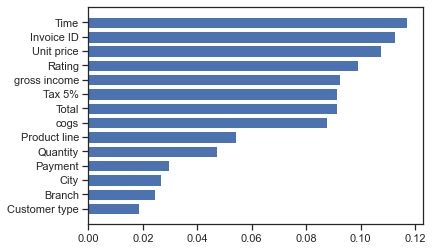

In [39]:
#Feature Importance BarChart On RandomForest
rfcfeatures_ascending=rfcfeatures.sort_values(by="Importances", ascending=True)
plt.barh(rfcfeatures_ascending["Feature_names"], rfcfeatures_ascending["Importances"])
plt.show()

In [40]:
#KNeighborsClassifier with all features
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()

knn.fit(x_train,y_train)

KNeighborsClassifier()

In [41]:
y_pred=knn.predict(x_test)
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print("K Neighbors Classification Report:\n",classification_report(y_test,y_pred))
print("Confusion Matrix:\n",confusion_matrix(y_test,y_pred))
print("Training Score:\n",knn.score(x_train,y_train)*100)

K Neighbors Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.53      0.54       100
           1       0.55      0.58      0.57       100

    accuracy                           0.56       200
   macro avg       0.56      0.55      0.55       200
weighted avg       0.56      0.56      0.55       200

Confusion Matrix:
 [[53 47]
 [42 58]]
Training Score:
 66.375


In [42]:
#Gaussian Naive Bayes with all features
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(x_train,y_train)

GaussianNB()

In [43]:
#Classification Report:
y_pred=gnb.predict(x_test)
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print("Naive Bayes Classification Report:\n",classification_report(y_test,y_pred))
print("Confusion Matrix:\n",confusion_matrix(y_test,y_pred))
print("Training Score:\n",gnb.score(x_train,y_train)*100)

Naive Bayes Classification Report:
               precision    recall  f1-score   support

           0       0.47      0.38      0.42       100
           1       0.48      0.57      0.52       100

    accuracy                           0.48       200
   macro avg       0.47      0.47      0.47       200
weighted avg       0.47      0.47      0.47       200

Confusion Matrix:
 [[38 62]
 [43 57]]
Training Score:
 55.375


In [44]:
#Permutation Feature Importance On Gaussian Naive Bayes
from sklearn.inspection import permutation_importance
imps = permutation_importance(gnb, x_test, y_test)
print(imps.importances_mean)

[-0.01   0.002 -0.004 -0.005 -0.002 -0.01  -0.013 -0.015 -0.015 -0.006
 -0.012 -0.015 -0.015 -0.001]


### Starting the Machine Learning Process On Limited Data

In [45]:
#I will also drop irrelevant and repetitive data
#this is information I gathered from my backwards elimination process done using R studio

data1.drop(data1.columns[[0, 2, 3, 5, 7, 8, 11, 12, 13, 14]], axis = 1, inplace = True)

In [46]:
data1.head()

,Branch,Gender,Unit price,Total,Time
0,0,0,74.69,548.9715,146
1,2,0,15.28,80.2200,23
2,0,1,46.33,340.5255,155
3,0,1,58.22,489.0480,485
4,0,1,86.31,634.3785,29


In [47]:
#removing my Y variable from the dataset
y=data1['Gender']
x=data1.drop('Gender',axis=1)

In [48]:
y.head()

0    0
1    0
2    1
3    1
4    1
Name: Gender, dtype: int32

In [49]:
x.head()

,Branch,Unit price,Total,Time
0,0,74.69,548.9715,146
1,2,15.28,80.2200,23
2,0,46.33,340.5255,155
3,0,58.22,489.0480,485
4,0,86.31,634.3785,29


In [50]:
#going with the pareto principle 
#80/20 train test split
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

In [51]:
#View split
print(len(x_train))
print(len(x_test))
print(len(y_train))
print(len(y_test))

800
200
800
200


In [52]:
#DecisionTree with limited features
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier(criterion='gini')

dtree.fit(x_train,y_train)

DecisionTreeClassifier()

In [53]:
#Classification Report:
y_pred=dtree.predict(x_test)
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print("Decision Tree Classification Report:\n",classification_report(y_test,y_pred))
print("Confusion Matrix:\n",confusion_matrix(y_test,y_pred))
print("Training Score:\n",dtree.score(x_train,y_train)*100)

Decision Tree Classification Report:
               precision    recall  f1-score   support

           0       0.45      0.46      0.45        96
           1       0.49      0.48      0.49       104

    accuracy                           0.47       200
   macro avg       0.47      0.47      0.47       200
weighted avg       0.47      0.47      0.47       200

Confusion Matrix:
 [[44 52]
 [54 50]]
Training Score:
 100.0


In [54]:
#Feature Importance Array DecisionTree
dtree.feature_importances_

array([0.05413094, 0.31114321, 0.3084803 , 0.32624555])

In [55]:
#Feature Importance On DecisionTree
dtreefeatures=pd.DataFrame({"Feature_names":x.columns, "Importances":dtree.feature_importances_})
dtreefeatures_ascending=dtreefeatures.sort_values(by="Importances", ascending=False)
dtreefeatures_ascending

,Feature_names,Importances
3,Time,0.326246
1,Unit price,0.311143
2,Total,0.308480
0,Branch,0.054131


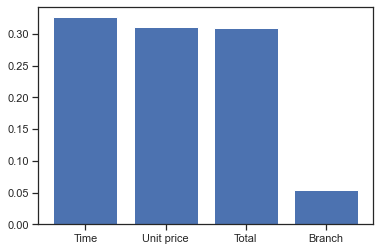

In [56]:
#Feature Importance BarChart On DecisionTree
plt.bar(dtreefeatures_ascending["Feature_names"], dtreefeatures_ascending["Importances"])
plt.show()

In [57]:
# from sklearn import tree
# clf = tree.DecisionTreeClassifier()
# clf = clf.fit(x, y)
# tree.plot_tree(clf) 

In [58]:
# import graphviz 
# dot_data = tree.export_graphviz(clf, out_file=None) 
# graph = graphviz.Source(dot_data) 
# graph.render("Final Project")

In [59]:
#RandomForest
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)

RandomForestClassifier()

In [60]:
#Classification Report:
y_pred=rfc.predict(x_test)
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print("Random Forest Classification Report:\n",classification_report(y_test,y_pred))
print("Confusion Matrix:\n",confusion_matrix(y_test,y_pred))
print("Training Score:\n",rfc.score(x_train,y_train)*100)

Random Forest Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.60      0.55        96
           1       0.56      0.46      0.51       104

    accuracy                           0.53       200
   macro avg       0.53      0.53      0.53       200
weighted avg       0.53      0.53      0.53       200

Confusion Matrix:
 [[58 38]
 [56 48]]
Training Score:
 100.0


In [61]:
#Feature Importance Array RandomForest
rfc.feature_importances_

array([0.06946268, 0.31083659, 0.30587149, 0.31382924])

In [62]:
#Feature Importance On RandomForest
rfcfeatures=pd.DataFrame({"Feature_names":x.columns, "Importances":rfc.feature_importances_})
rfcfeatures_ascending=rfcfeatures.sort_values(by="Importances", ascending=False)
rfcfeatures_ascending

,Feature_names,Importances
3,Time,0.313829
1,Unit price,0.310837
2,Total,0.305871
0,Branch,0.069463


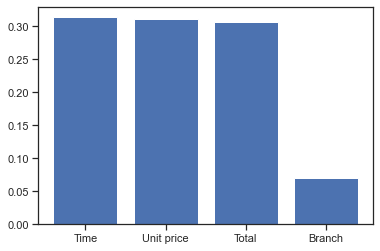

In [63]:
#Feature Importance BarChart On RandomForest
plt.bar(rfcfeatures_ascending["Feature_names"], rfcfeatures_ascending["Importances"])
plt.show()

In [64]:
#KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()

knn.fit(x_train,y_train)

KNeighborsClassifier()

In [65]:
#Classification Report:
y_pred=knn.predict(x_test)
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print("K Neighbors Classification Report:\n",classification_report(y_test,y_pred))
print("Confusion Matrix:\n",confusion_matrix(y_test,y_pred))
print("Training Score:\n",knn.score(x_train,y_train)*100)

K Neighbors Classification Report:
               precision    recall  f1-score   support

           0       0.49      0.55      0.52        96
           1       0.53      0.47      0.50       104

    accuracy                           0.51       200
   macro avg       0.51      0.51      0.51       200
weighted avg       0.51      0.51      0.51       200

Confusion Matrix:
 [[53 43]
 [55 49]]
Training Score:
 68.125


In [66]:
# Gaussian Naive Bayes
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(x_train,y_train)

GaussianNB()

In [67]:
#Classification Report:
y_pred=gnb.predict(x_test)
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
print("Naive Bayes Classification Report:\n",classification_report(y_test,y_pred))
print("Confusion Matrix:\n",confusion_matrix(y_test,y_pred))
print("Training Score:\n",gnb.score(x_train,y_train)*100)

Naive Bayes Classification Report:
               precision    recall  f1-score   support

           0       0.47      0.52      0.50        96
           1       0.51      0.46      0.48       104

    accuracy                           0.49       200
   macro avg       0.49      0.49      0.49       200
weighted avg       0.49      0.49      0.49       200

Confusion Matrix:
 [[50 46]
 [56 48]]
Training Score:
 57.125


In [68]:
#Permutation Feature Importance On Gaussian Naive Bayes
from sklearn.inspection import permutation_importance
imps = permutation_importance(gnb, x_test, y_test)
print(imps.importances_mean)

[ 0.006 -0.031 -0.016 -0.017]


In [70]:
# data.to_csv("Feature Engineering.csv")

<h1><center>💯💯THANK YOU💯💯💯</center></h1>